<a href="https://colab.research.google.com/github/jeetpatel1405/Road-ShopSign-Detection-Training/blob/main/YoloV8_ShopSignDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install torch torchvision


In [3]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 18.4 MB/s eta 0:00:00


In [4]:
!git clone https://github.com/ultralytics/ultralytics
%cd ultralytics


Cloning into 'ultralytics'...
remote: Enumerating objects: 45222, done.
remote: Counting objects: 100% (888/888), done.
remote: Compressing objects: 100% (596/596), done.
remote: Total 45222 (delta 580), reused 496 (delta 292), pack-reused 44334 (from 1)
Receiving objects: 100% (45222/45222), 38.63 MiB | 14.24 MiB/s, done.
Resolving deltas: 100% (33520/33520), done.
/content/ultralytics


In [50]:
!unzip -q "/content/drive/MyDrive/Colab Notebooks/ShopSignDetection.v5i.yolov8.zip" -d "/content/shopsigndataset2"


In [51]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [64]:
import cv2
import matplotlib.pyplot as plt
import os

class_names = {
    "0": "Advertisement ",
    "1": "Shop  Sign",
    "2": "Traffic Sign"
    #Add more mappings as needed
}

def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # Denormalize the coordinates.
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)

        thickness = max(2, int(w/275))

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=(0, 0, 255),
            thickness=thickness
        )
        # Add label
        label = class_names.get(labels[box_num], "Unknown")
        font_scale = 1.5
        font_thickness = 2
        label_size, baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, font_thickness)
        label_ymin = max(ymin, label_size[1] + baseline)
        cv2.rectangle(
            image,
            (xmin, label_ymin - label_size[1] - baseline),
            (xmin + label_size[0], label_ymin + baseline),
            color=(0,0,225),
            thickness=cv2.FILLED
        )
        cv2.putText(
            image,
            label,
            (xmin, label_ymin - baseline),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),  # White color for text
            font_thickness
        )
    return image

In [65]:
# Function to plot images with the bounding boxes.
import glob
import random

def plot(image_paths, label_paths, num_samples):
    all_images = []
    all_images.extend(glob.glob(image_paths+'/*.jpg'))
    all_images.extend(glob.glob(image_paths+'/*.JPG'))

    all_images.sort()

    num_images = len(all_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image_name = all_images[j]
        image_name = '.'.join(image_name.split(os.path.sep)[-1].split('.')[:-1])
        image = cv2.imread(all_images[j])
        with open(os.path.join(label_paths, image_name+'.txt'), 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=1)
    plt.tight_layout()
    plt.show()

In [66]:
def plot_single_image(image_path, label_path):
    """
    Plot a single image with bounding boxes and labels.
    Args:
        image_path (str): Path to the image file.
        label_path (str): Path to the corresponding label file.
    """
    image = cv2.imread(image_path)  # Read the image
    with open(label_path, 'r') as f:
        bboxes = []
        labels = []
        label_lines = f.readlines()
        for label_line in label_lines:
            # Parse each line in the label file
            values = label_line.split()
            class_id = values[0]  # First value is the class ID
            x_c, y_c, w, h = map(float, values[1:])  # Bounding box coordinates
            bboxes.append([x_c, y_c, w, h])
            labels.append(class_id)

    # Plot the bounding boxes and labels on the image
    result_image = plot_box(image, bboxes, labels)

    # Display the image
    plt.figure(figsize=(8, 6))
    plt.imshow(result_image[:, :, ::-1])  # Convert BGR to RGB for display
    plt.axis('off')
    plt.show()


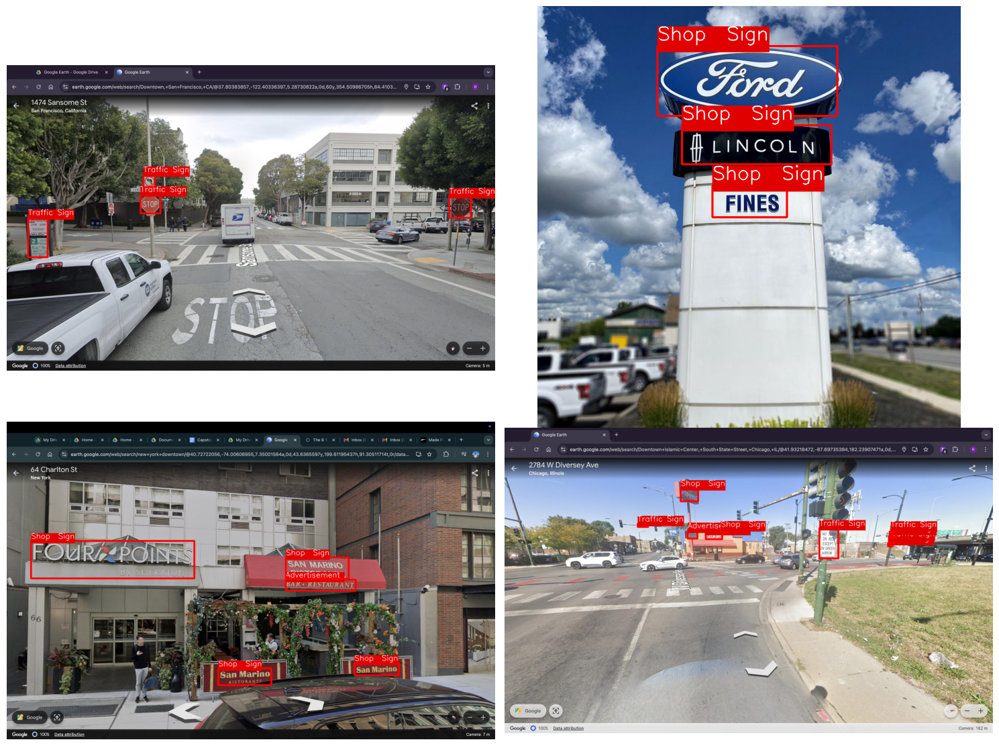

In [67]:
# Visualize a few training images.
plot(
    image_paths='/content/shopsigndataset1/train/images',
    label_paths='/content/shopsigndataset1/train/labels',
    num_samples=4,
)

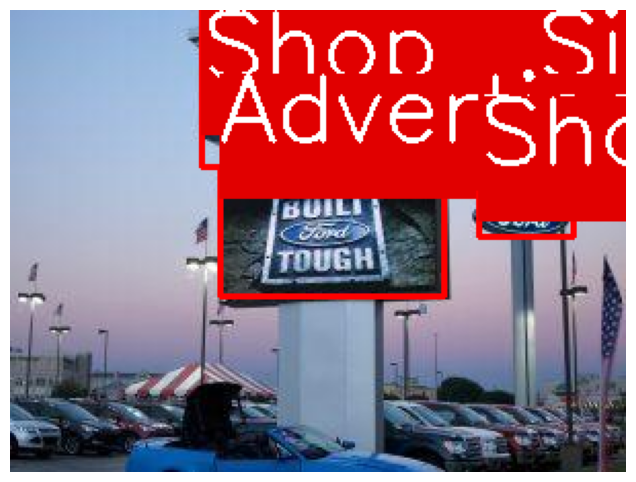

In [68]:
plot_single_image(
    image_path='/content/shopsigndataset2/train/images/image_109_jpg.rf.610f206ee30e79385a5b45517cd2f831.jpg',
    label_path='/content/shopsigndataset2/train/labels/image_109_jpg.rf.610f206ee30e79385a5b45517cd2f831.txt'
)


In [70]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Define paths
base_dir = '/content/shopsigndataset1'
train_images_dir = os.path.join(base_dir, 'train/images')
train_labels_dir = os.path.join(base_dir, 'train/labels')
val_images_dir = os.path.join(base_dir, 'val/images')
val_labels_dir = os.path.join(base_dir, 'val/labels')
test_images_dir = os.path.join(base_dir, 'test/images')
test_labels_dir = os.path.join(base_dir, 'test/labels')

# Create directories for val and test splits
os.makedirs(val_images_dir, exist_ok=True)
os.makedirs(val_labels_dir, exist_ok=True)
os.makedirs(test_images_dir, exist_ok=True)
os.makedirs(test_labels_dir, exist_ok=True)

# Get list of all image files
image_files = [f for f in os.listdir(train_images_dir) if f.endswith(('.jpg', '.png'))]

# Split dataset into train, val, and test (e.g., 70% train, 20% val, 10% test)
train_files, temp_files = train_test_split(image_files, test_size=0.3, random_state=42)
val_files, test_files = train_test_split(temp_files, test_size=0.33, random_state=42)  # 0.33 * 30% = 10%

# Function to move files
def move_files(file_list, src_images_dir, src_labels_dir, dest_images_dir, dest_labels_dir):
    for file_name in file_list:
        base_name = os.path.splitext(file_name)[0]
        shutil.move(os.path.join(src_images_dir, file_name), os.path.join(dest_images_dir, file_name))
        shutil.move(os.path.join(src_labels_dir, f"{base_name}.txt"), os.path.join(dest_labels_dir, f"{base_name}.txt"))

# Move files to validation and test folders
move_files(val_files, train_images_dir, train_labels_dir, val_images_dir, val_labels_dir)
move_files(test_files, train_images_dir, train_labels_dir, test_images_dir, test_labels_dir)

print("Dataset split completed!")
print(f"Training set: {len(train_files)} images")
print(f"Validation set: {len(val_files)} images")
print(f"Test set: {len(test_files)} images")


Dataset split completed!
Training set: 830 images
Validation set: 239 images
Test set: 118 images


In [75]:
EPOCHS = 50
!yolo task=detect mode=train model=yolov8n.pt imgsz=1000 data=/content/shopsigndataset1/data.yaml epochs={EPOCHS} batch=32 name=yolov8n_v8_50e

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/shopsigndataset1/data.yaml, epochs=50, time=None, patience=100, batch=32, imgsz=1000, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_v8_50e5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_c

In [76]:
!yolo task=detect mode=val model=/content/ultralytics/runs/detect/yolov8n_v8_50e5/weights/best.pt name=yolov8n_eval data=/content/shopsigndataset1/data.yaml


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/shopsigndataset1/val/labels.cache... 239 images, 0 backgrounds, 0 corrupt: 100% 239/239 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 15/15 [00:08<00:00,  1.71it/s]
                   all        239        623      0.557      0.532      0.536      0.328
    advertisement-sign         90        150      0.361      0.273      0.238      0.135
        shop-name-sign        176        286      0.668      0.668      0.702        0.4
           taffic-sign         97        187      0.643      0.655      0.669      0.448
Speed: 3.2ms preprocess, 8.0ms inference, 0.0ms loss, 6.8ms postprocess per image
Results saved to runs/detect/yolov8n_eval
💡 Learn more at https://docs.ultralytics.com/modes/val


In [88]:
!yolo task=detect \
mode=predict \
model=/content/ultralytics/runs/detect/yolov8n_v8_50e5/weights/best.pt \
source=/content/shopsigndataset1/test/images \
imgsz=800 \
name=yolov8n_v8_50e_infer1280 \
hide_labels=True

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in in the future. Use 'show_labels' instead.
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs

image 1/118 /content/shopsigndataset1/test/images/image_1001_png.rf.f2af8e188c5ce1ba150dbe097e3b9ea8.jpg: 544x800 2 shop-name-signs, 1 taffic-sign, 52.1ms
image 2/118 /content/shopsigndataset1/test/images/image_1005_png.rf.1002d909276644f8f206068ad1095256.jpg: 544x800 3 shop-name-signs, 1 taffic-sign, 11.4ms
image 3/118 /content/shopsigndataset1/test/images/image_1010_png.rf.3c5a224f9d0b5049ef76b80ac4e71fd0.jpg: 544x800 1 shop-name-sign, 11.3ms
image 4/118 /content/shopsigndataset1/test/images/image_1020_png.rf.8506346760d728235ae62f1762a57fa6.jpg: 544x800 3 taffic-signs, 11.4ms
image 5/118 /content/shopsigndataset1/test/images/image_1022_png.rf.bbda6fe87e964fc7786192dbe779a0f4.jpg: 544x800 1 shop-name-sign, 5 taffic-signs

In [89]:
def visualize(result_dir, num_samples=4):
    """
    Function accepts a list of images and plots
    them in a 2x2 grid.
    """
    plt.figure(figsize=(20, 12))
    image_names = glob.glob(os.path.join(result_dir, '*.jpg'))
    random.shuffle(image_names)
    for i, image_name in enumerate(image_names):
        image = plt.imread(image_name)
        plt.subplot(2, 2, i+1)
        plt.imshow(image)
        plt.axis('off')
        if i == num_samples-1:
            break
    plt.tight_layout()
    plt.show()


# def visualize(result_dir, num_samples=4, class_names=None):
#     plt.figure(figsize=(20, 12))
#     image_names = glob.glob(os.path.join(result_dir, '*.jpg'))
#     random.shuffle(image_names)

#     if len(image_names) == 0:
#         print("No images found in the directory.")
#         return

#     for i, image_name in enumerate(image_names[:num_samples]):
#         print(f"Loading image: {image_name}")  # Debug image path
#         image = plt.imread(image_name)
#         img_height, img_width, _ = image.shape

#         # Find label file
#         label_name = os.path.splitext(image_name)[0] + '.txt'
#         print(f"Looking for label file: {label_name}")  # Debug label file path
#         if not os.path.exists(label_name):
#             print(f"Label file not found for {image_name}")
#             continue

#         with open(label_name, 'r') as f:
#             labels = f.readlines()
#             print(f"Labels: {labels}")  # Debug label content

#         plt.subplot(2, 2, i + 1)
#         plt.imshow(image)
#         plt.axis('off')

#         # Draw bounding boxes and labels
#         for label in labels:
#             class_id, x_center, y_center, width, height = map(float, label.split())
#             xmin, ymin, xmax, ymax = yolo2bbox([x_center, y_center, width, height], img_width, img_height)

#             plt.gca().add_patch(Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
#                                           edgecolor='red', facecolor='none', linewidth=2))

#             class_name = class_names[int(class_id)] if class_names else str(int(class_id))
#             plt.text(xmin, ymin - 10, class_name, color='red', fontsize=12, backgroundcolor='white')

#     plt.tight_layout()
#     plt.show()

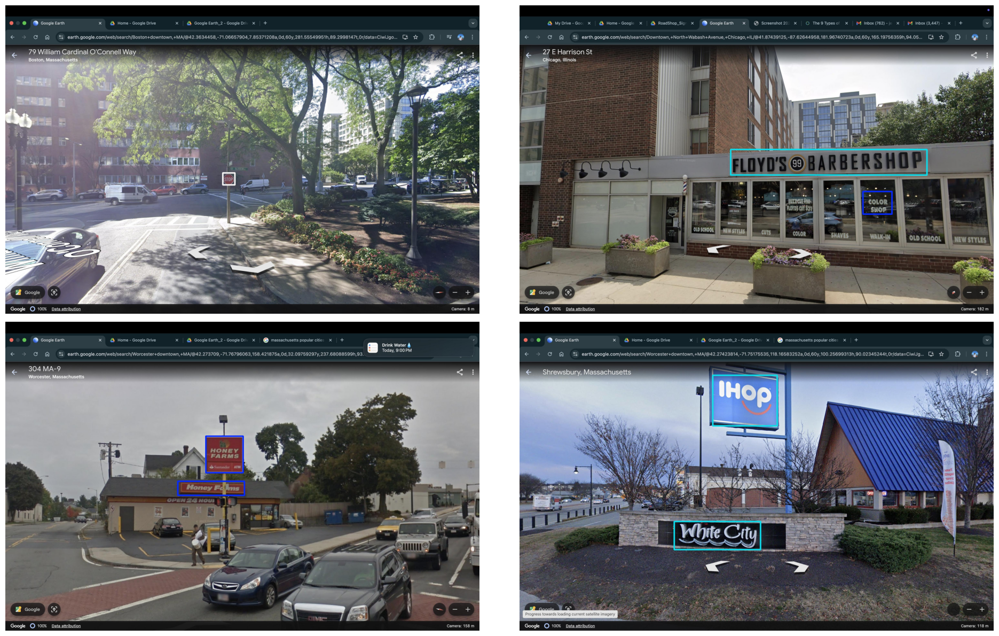

In [91]:
class_names = {
    0: "Advertisement Sign",
    1: "Shop Sign",
    2: "Traffic Sign"
}

visualize('runs/detect/yolov8n_v8_50e_infer12802')


In [92]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import os
import random
from matplotlib.patches import Rectangle

def visualize_predictions(model_path, source_dir, num_samples=4):
    """
    Runs detection on the given images and visualizes predictions with bounding boxes and labels.

    Args:
        model_path (str): Path to the YOLO model (e.g., best.pt).
        source_dir (str): Directory containing images for inference.
        num_samples (int): Number of images to visualize.
    """
    # Load the YOLO model
    model = YOLO(model_path)

    # Run inference on the source directory
    results = model.predict(source=source_dir, save=False, imgsz=800, conf=0.5)

    # Get all images from the source directory
    image_names = [result.path for result in results]
    random.shuffle(image_names)

    plt.figure(figsize=(20, 12))

    for i, result in enumerate(results[:num_samples]):
        # Load the image
        image = result.orig_img  # Original image

        # Plot the image
        plt.subplot(2, 2, i + 1)
        plt.imshow(image)
        plt.axis('off')

        # Add bounding boxes and labels
        for box in result.boxes:
            # Extract box coordinates
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            # Extract confidence and class label
            conf = box.conf[0]
            cls = int(box.cls[0])
            label = f"{model.names[cls]} {conf:.2f}"

            # Draw bounding box
            plt.gca().add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none', linewidth=2))
            # Add label
            plt.text(x1, y1 - 10, label, color='white', fontsize=12, backgroundcolor='red')

    plt.tight_layout()
    plt.show()



image 1/118 /content/shopsigndataset1/test/images/image_1001_png.rf.f2af8e188c5ce1ba150dbe097e3b9ea8.jpg: 544x800 1 shop-name-sign, 33.6ms
image 2/118 /content/shopsigndataset1/test/images/image_1005_png.rf.1002d909276644f8f206068ad1095256.jpg: 544x800 3 shop-name-signs, 1 taffic-sign, 7.9ms
image 3/118 /content/shopsigndataset1/test/images/image_1010_png.rf.3c5a224f9d0b5049ef76b80ac4e71fd0.jpg: 544x800 (no detections), 7.8ms
image 4/118 /content/shopsigndataset1/test/images/image_1020_png.rf.8506346760d728235ae62f1762a57fa6.jpg: 544x800 2 taffic-signs, 7.8ms
image 5/118 /content/shopsigndataset1/test/images/image_1022_png.rf.bbda6fe87e964fc7786192dbe779a0f4.jpg: 544x800 5 taffic-signs, 14.7ms
image 6/118 /content/shopsigndataset1/test/images/image_1023_png.rf.382073585eb0e44ab82d8eea50bb545c.jpg: 544x800 1 advertisement-sign, 1 taffic-sign, 11.0ms
image 7/118 /content/shopsigndataset1/test/images/image_1025_png.rf.5a9208d558831c3b9d3d0a92a093d45d.jpg: 544x800 1 shop-name-sign, 2 taff

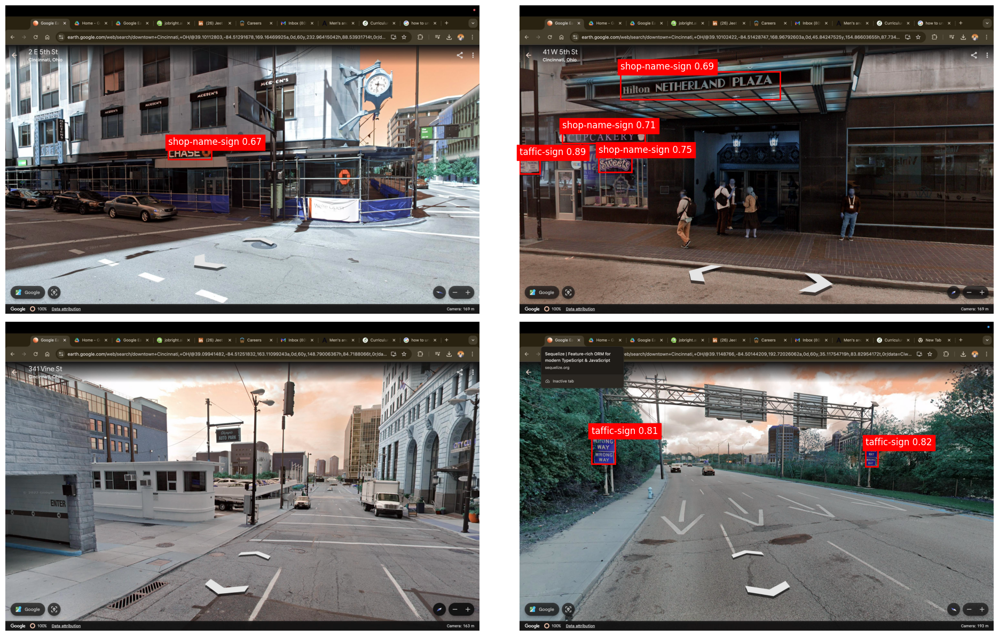

In [93]:
# Path to your YOLO model
model_path = "/content/ultralytics/runs/detect/yolov8n_v8_50e5/weights/best.pt"
# Directory containing images for detection
source_dir = "/content/shopsigndataset1/test/images"

visualize_predictions(model_path, source_dir, num_samples=4)


In [94]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from google.colab import files  # For uploading files in Colab

def upload_and_predict(model_path):
    """
    Upload an image and perform object detection using the YOLO model.

    Args:
        model_path (str): Path to the YOLO model (e.g., best.pt).
    """
    # Load the YOLO model
    model = YOLO(model_path)

    # Upload an image
    print("Upload an image:")
    uploaded = files.upload()

    # Get the uploaded file path
    image_path = list(uploaded.keys())[0]
    print(f"Uploaded image: {image_path}")

    # Run inference on the uploaded image
    result = model.predict(source=image_path, save=False, imgsz=800, conf=0.5)[0]

    # Load the original image
    image = result.orig_img

    # Plot the image
    plt.figure(figsize=(10, 8))
    plt.imshow(image)
    plt.axis('off')

    # Add bounding boxes and labels
    for box in result.boxes:
        # Extract box coordinates
        x1, y1, x2, y2 = box.xyxy[0].tolist()
        # Extract confidence and class label
        conf = box.conf[0]
        cls = int(box.cls[0])
        label = f"{model.names[cls]} {conf:.2f}"

        # Draw bounding box
        plt.gca().add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none', linewidth=2))
        # Add label
        plt.text(x1, y1 - 10, label, color='white', fontsize=12, backgroundcolor='red')

    plt.tight_layout()
    plt.show()


Upload an image:


Saving image_773.png to image_773.png
Uploaded image: image_773.png

image 1/1 /content/ultralytics/image_773.png: 544x800 2 shop-name-signs, 3 taffic-signs, 8.5ms
Speed: 3.3ms preprocess, 8.5ms inference, 1.2ms postprocess per image at shape (1, 3, 544, 800)


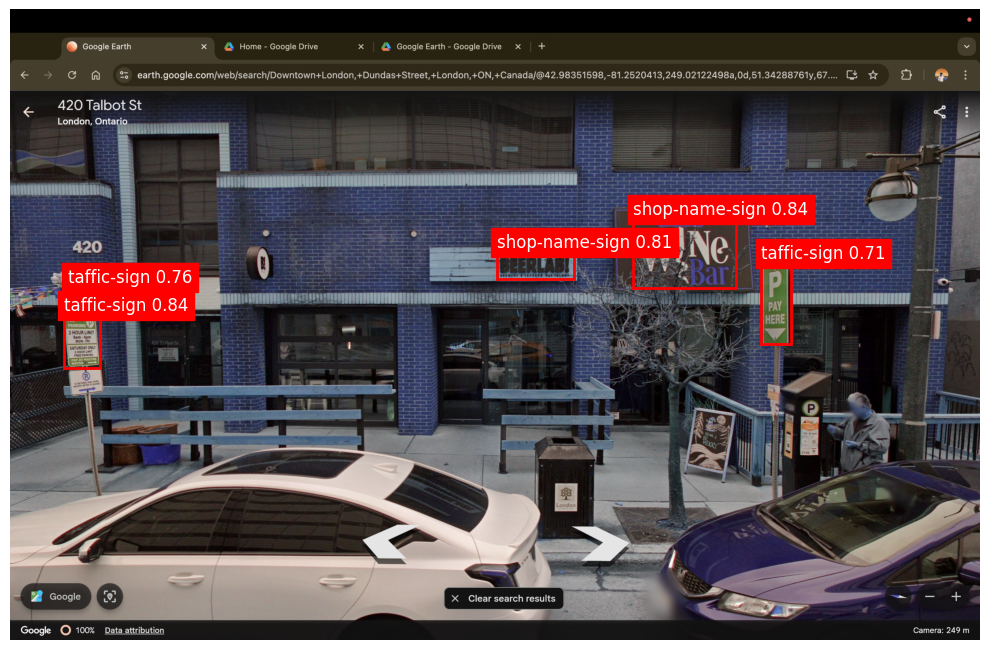

In [96]:
# Path to your YOLO model
model_path = "/content/ultralytics/runs/detect/yolov8n_v8_50e5/weights/best.pt"

# Call the function to upload an image and perform detection
upload_and_predict(model_path)


In [97]:
from ultralytics import YOLO

def export_to_tflite(model_path, output_dir):
    """
    Export a YOLO model to TensorFlow Lite format.

    Args:
        model_path (str): Path to the YOLO model (e.g., best.pt).
        output_dir (str): Directory to save the exported TFLite model.
    """
    # Load the YOLO model
    model = YOLO(model_path)

    # Export the model to TFLite format
    print("Exporting the YOLO model to TFLite...")
    model.export(format='tflite', dynamic=False, simplify=True, device="cpu")

    print(f"TFLite model exported to {output_dir}.")


In [100]:
# Path to your YOLO model
model_path = "/content/ultralytics/runs/detect/yolov8n_v8_50e5/weights/best.pt"

# Directory to save the TFLite model
output_dir = "/content/ultralytics"

# Export the model
export_to_tflite(model_path, output_dir)


Exporting the YOLO model to TFLite...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from '/content/ultralytics/runs/detect/yolov8n_v8_50e5/weights/best.pt' with input shape (1, 3, 1024, 1024) BCHW and output shape(s) (1, 7, 21504) (6.0 MB)

TensorFlow SavedModel: starting export with tensorflow 2.17.1...

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.42...
ONNX: export success ✅ 1.4s, saved as '/content/ultralytics/runs/detect/yolov8n_v8_50e5/weights/best.onnx' (12.2 MB)
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.22.3...
TensorFlow SavedModel: export success ✅ 15.2s, saved as '/content/ultralytics/runs/detect/yolov8n_v8_50e5/weights/best_saved_model' (30.3 MB)

TensorFlow Lite: starting export with tensorflow 2.17.1...
TensorFlow Lite: export success ✅ 0.0s, saved as '/content/ultralytics/runs/detect

In [101]:
from google.colab import files

# Path to the TFLite model
tflite_model_path = "/content/ultralytics/runs/detect/yolov8n_v8_50e5/weights/best_saved_model/best_float32.tflite"

# Download the TFLite model
files.download(tflite_model_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>